# Mercedes-Benz
https://www.kaggle.com/c/mercedes-benz-greener-manufacturing  
  
  
## データの読み込み

In [2]:
%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy.stats import skew
from sklearn.linear_model import Lasso
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

In [3]:
df_train = pd.read_csv('./Mercedes-Benz/train.csv', index_col="ID")

df_test = pd.read_csv('./Mercedes-Benz/test.csv', index_col="ID")

## データの分析

In [4]:
df_train.describe()

,y,X10,X11,X12,X13,X14,X15,X16,X17,X18,...,X375,X376,X377,X378,X379,X380,X382,X383,X384,X385
count,4209.000000,4209.000000,4209.0,4209.000000,4209.000000,4209.000000,4209.000000,4209.000000,4209.000000,4209.000000,...,4209.000000,4209.000000,4209.000000,4209.000000,4209.000000,4209.000000,4209.000000,4209.000000,4209.000000,4209.000000
mean,100.669318,0.013305,0.0,0.075077,0.057971,0.428130,0.000475,0.002613,0.007603,0.007840,...,0.318841,0.057258,0.314802,0.020670,0.009503,0.008078,0.007603,0.001663,0.000475,0.001426
std,12.679381,0.114590,0.0,0.263547,0.233716,0.494867,0.021796,0.051061,0.086872,0.088208,...,0.466082,0.232363,0.464492,0.142294,0.097033,0.089524,0.086872,0.040752,0.021796,0.037734
min,72.110000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,90.820000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,99.150000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,109.010000,0.000000,0.0,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,...,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,265.320000,1.000000,0.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [5]:
df_train.head()

,y,X0,X1,X2,X3,X4,X5,X6,X8,X10,...,X375,X376,X377,X378,X379,X380,X382,X383,X384,X385
ID,,,,,,,,,,,,,,,,,,,,,
0,130.81,k,v,at,a,d,u,j,o,0,...,0,0,1,0,0,0,0,0,0,0
6,88.53,k,t,av,e,d,y,l,o,0,...,1,0,0,0,0,0,0,0,0,0
7,76.26,az,w,n,c,d,x,j,x,0,...,0,0,0,0,0,0,1,0,0,0
9,80.62,az,t,n,f,d,x,l,e,0,...,0,0,0,0,0,0,0,0,0,0
13,78.02,az,v,n,f,d,h,d,n,0,...,0,0,0,0,0,0,0,0,0,0


excelでも中身を確認  
X0～X8: アルファベット1~2文字  
X9: 欠番  
X10～: 0または1  
各変数は匿名化されたもので、実際は4WD, ヘッドアップディスプレイなど  
目的変数yはテストに合格する時間(秒) 

## 外れ値の除外

各IDとyの散布図

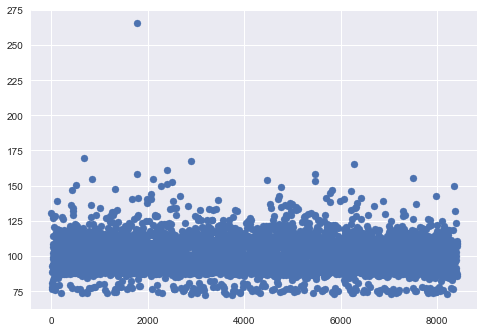

In [6]:
plt.scatter(df_train.index, df_train.y)

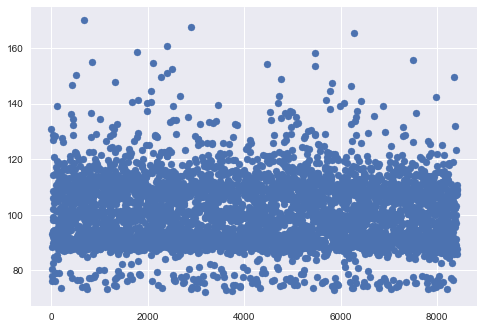

In [4]:
# yが200以上のものを外れ値として取り除く
df_train = df_train[~(df_train['y'] > 200)]
# 除外後の散布図を確認
plt.scatter(df_train.index, df_train.y)

In [5]:
#ID及びy以外の全データを結合
# 'X0'から'X385'(最終列)まで
df_all = pd.concat((df_train.loc[:,'X0':'X385'], df_test.loc[:,'X0':'X385']))
# df_allの中身を確認
df_all.to_csv("df_all_m.csv")

## 多重共線性の確認

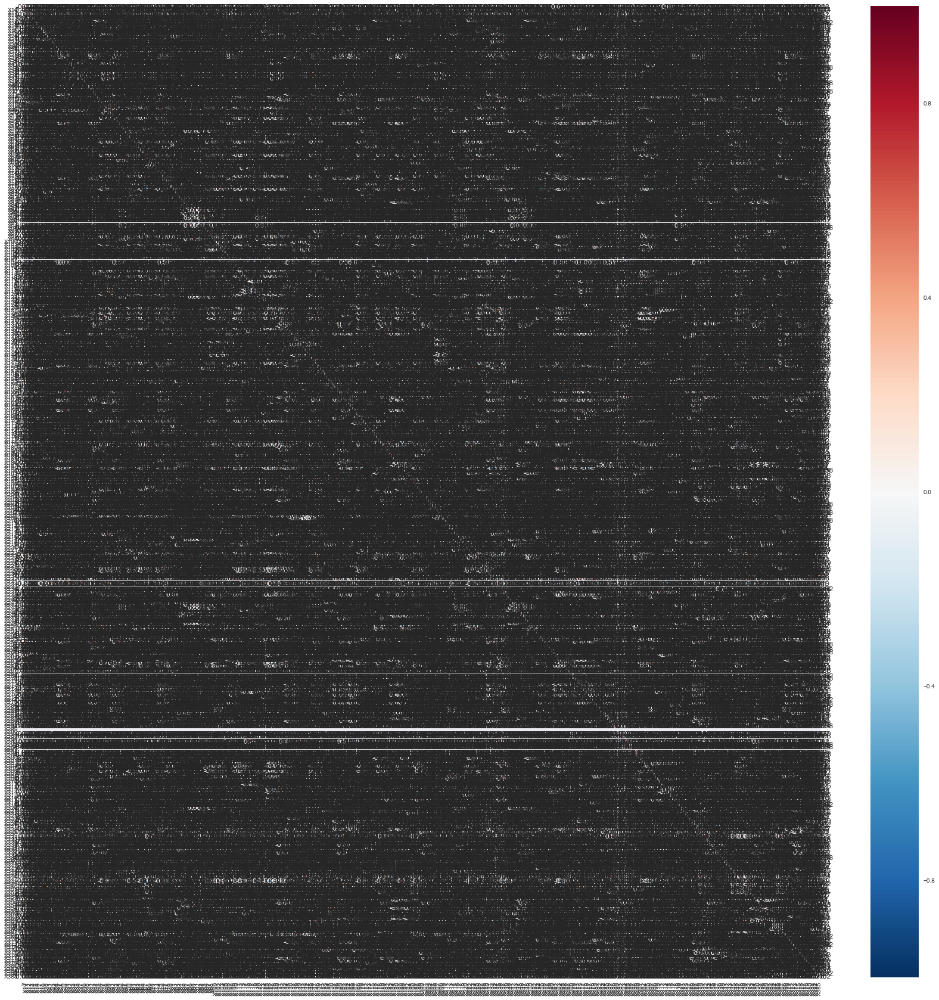

In [19]:
#相関係数行列の可視化
# 行１列１、縦横30インチの箱を用意する
fig, ax = plt.subplots(1, 1, figsize=(30, 30))
# seabornのheatmapを作成
# df_train.corr(): トレーニングデータの相関係数
sns.heatmap(df_train.corr(), vmax=1, vmin=-1, center=0, annot=True, ax=ax)

見事に黒すぎて何も見えない  
figsizeを単純に大きくするとエラーになってしまったので分割して調べることにする

In [6]:
df_train_1 = df_train.loc[:, :'X90']
df_train_2 = df_train.loc[:, 'X91':'X180']
df_train_3 = df_train.loc[:, 'X181':'X270']
df_train_4 = df_train.loc[:, 'X271':'X360']
df_train_5 = df_train.loc[:, 'X361':]

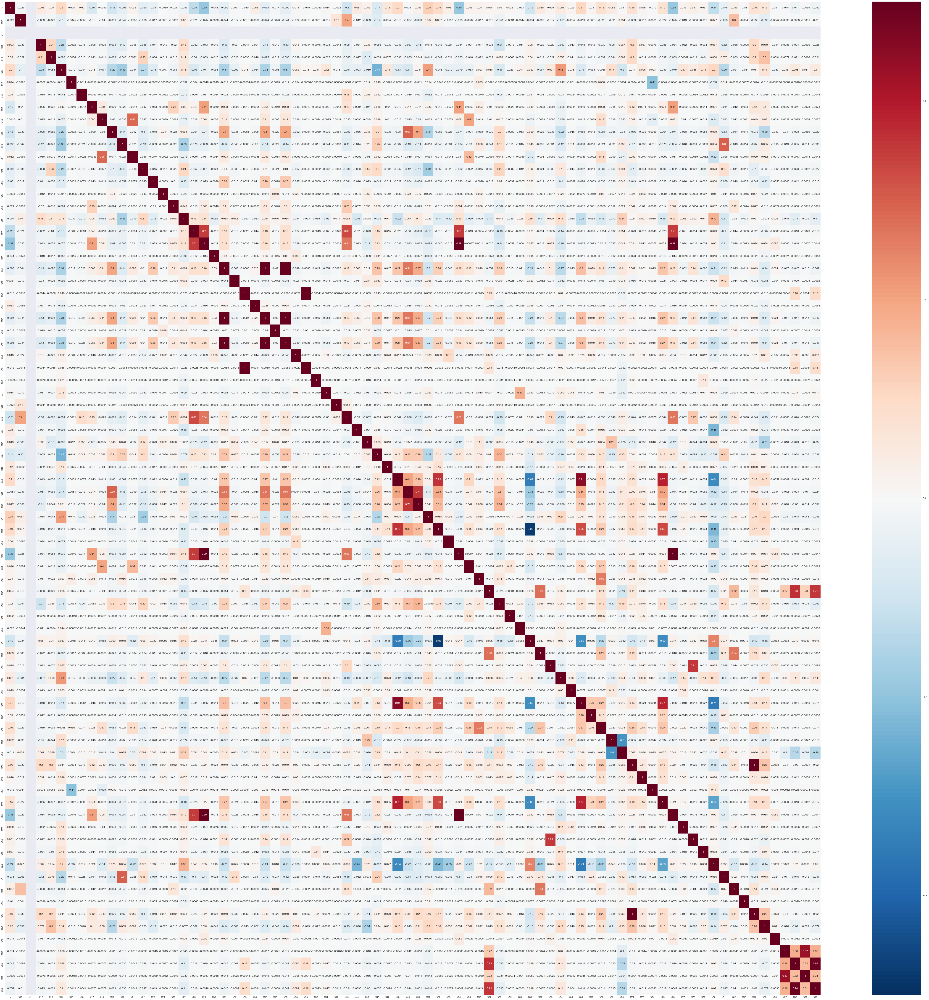

In [11]:
#相関係数行列の可視化
# 行１列１、縦横30インチの箱を用意する
fig, ax = plt.subplots(1, 1, figsize=(80, 80))
# seabornのheatmapを作成
# df_train.corr(): トレーニングデータの相関係数
sns.heatmap(df_train_1.corr(), vmax=1, vmin=-1, center=0, annot=True, ax=ax)

In [7]:
# 上の表で絶対値が0.8以上のものを取り除く
df_all.drop(['X35', 'X37', 'X39', 'X54', 'X61', 'X66', 'X76', 'X84', 'X89', 'X90'], axis=1, inplace=True)
df_train.drop(['X35', 'X37', 'X39', 'X54', 'X61', 'X66', 'X76', 'X84', 'X89', 'X90'], axis=1, inplace=True)

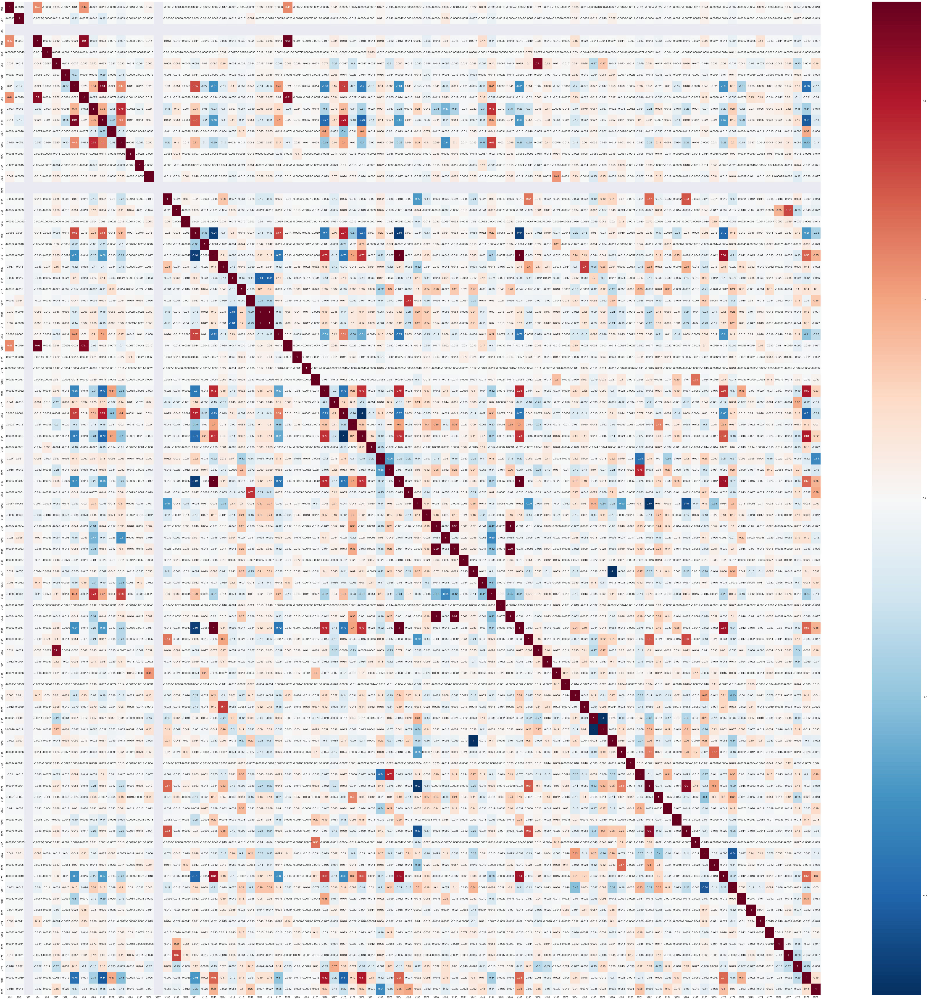

In [13]:
#相関係数行列の可視化
# 行１列１、縦横30インチの箱を用意する
fig, ax = plt.subplots(1, 1, figsize=(80, 80))
# seabornのheatmapを作成
# df_train.corr(): トレーニングデータの相関係数
sns.heatmap(df_train_2.corr(), vmax=1, vmin=-1, center=0, annot=True, ax=ax)

In [8]:
# 上の表で絶対値が0.8以上のものを取り除く
df_all.drop(['X99','X101','X113','X118','X119','X122','X130','X134','X140','X146','X147','X150','X157','X162','X166','X170','X171','X179'], axis=1, inplace=True)
df_train.drop(['X99','X101','X113','X118','X119','X122','X130','X134','X140','X146','X147','X150','X157','X162','X166','X170','X171','X179'], axis=1, inplace=True)

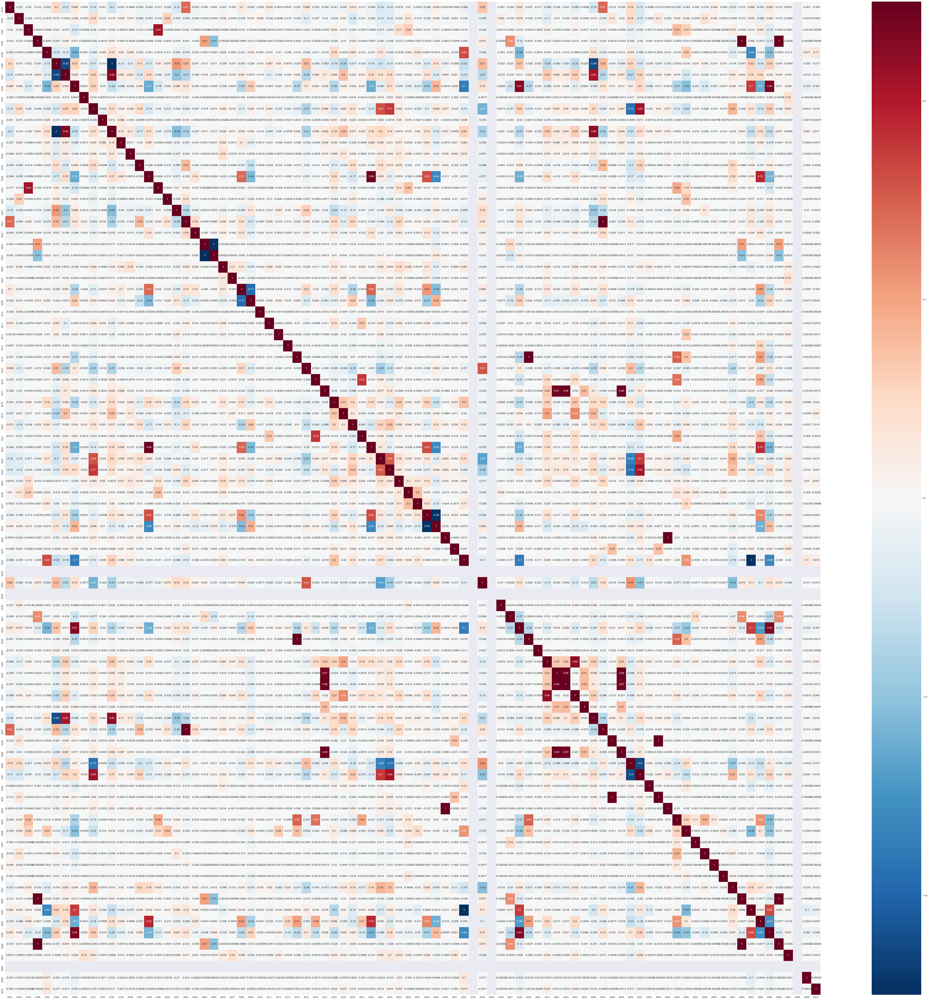

In [15]:
#相関係数行列の可視化
# 行１列１、縦横30インチの箱を用意する
fig, ax = plt.subplots(1, 1, figsize=(80, 80))
# seabornのheatmapを作成
# df_train.corr(): トレーニングデータの相関係数
sns.heatmap(df_train_3.corr(), vmax=1, vmin=-1, center=0, annot=True, ax=ax)

In [9]:
# 上の表で絶対値が0.8以上のものを取り除く
df_all.drop(['X187','X194','X199','X205','X222','X229','X239','X242','X243','X244','X246','X247','X249','X251','X253','X254','X262','X263','X265','X266'], axis=1, inplace=True)
df_train.drop(['X187','X194','X199','X205','X222','X229','X239','X242','X243','X244','X246','X247','X249','X251','X253','X254','X262','X263','X265','X266'], axis=1, inplace=True)

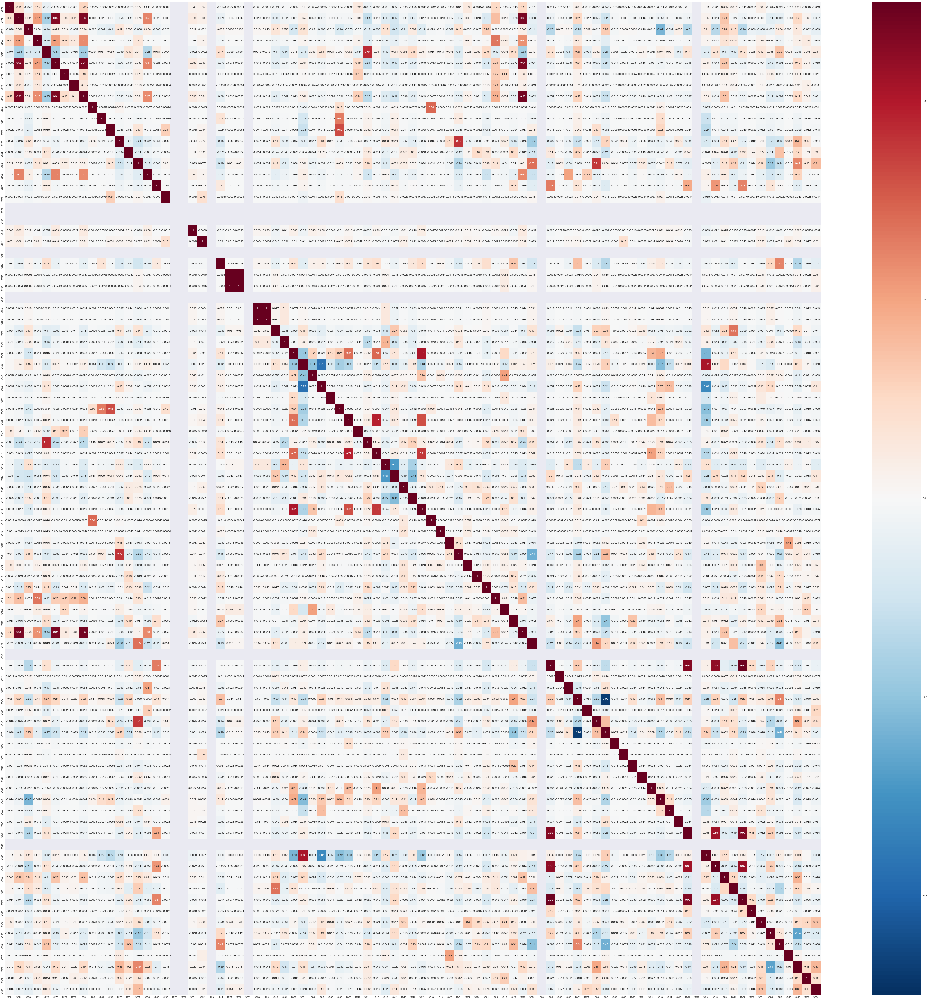

In [17]:
#相関係数行列の可視化
# 行１列１、縦横30インチの箱を用意する
fig, ax = plt.subplots(1, 1, figsize=(80, 80))
# seabornのheatmapを作成
# df_train.corr(): トレーニングデータの相関係数
sns.heatmap(df_train_4.corr(), vmax=1, vmin=-1, center=0, annot=True, ax=ax)

In [10]:
## 上の表で絶対値が0.8以上のものを取り除く( 2度やってしまったのでコメントアウト)
df_all.drop(['X276','X279','X296','X299','X317','X328','X337','X346','X348','X349','X352'], axis=1, inplace=True)
df_train.drop(['X276','X279','X296','X299','X317','X328','X337','X346','X348','X349','X352'], axis=1, inplace=True)

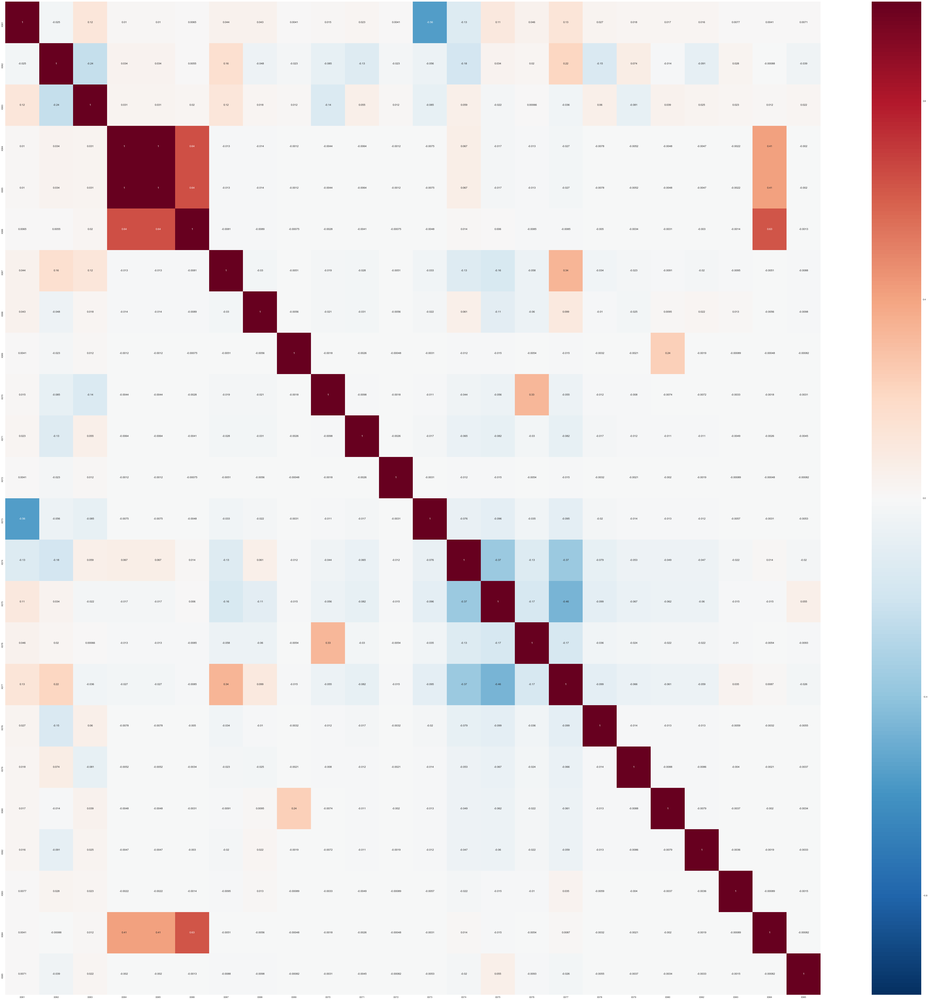

In [21]:
#相関係数行列の可視化
# 行１列１、縦横30インチの箱を用意する
fig, ax = plt.subplots(1, 1, figsize=(80, 80))
# seabornのheatmapを作成
# df_train.corr(): トレーニングデータの相関係数
sns.heatmap(df_train_5.corr(), vmax=1, vmin=-1, center=0, annot=True, ax=ax)

In [11]:
# 上の表で絶対値が0.8以上のものを取り除く
df_all.drop(['X365'], axis=1, inplace=True)
df_train.drop(['X365'], axis=1, inplace=True)

In [23]:
# どれだけ列が減ったか確認する
df_all.shape

(8417, 316)

In [ ]:
# jupyter notebookの起動時の引数を追加するとエラーが出なくなるらしい
# jupyter notebook --NotebookApp.iopub_data_rate_limit=100000000

#相関係数行列の可視化
# 行１列１、縦横30インチの箱を用意する
fig, ax = plt.subplots(1, 1, figsize=(80, 80))
# seabornのheatmapを作成
# df_train.corr(): トレーニングデータの相関係数
sns.heatmap(df_train.corr(), vmax=1, vmin=-1, center=0, annot=True, ax=ax)

In [12]:
# 上の表で絶対値が0.8以上のものを取り除く
df_all.drop(['X94','X98','X102','X111','X120','X126','X128','X129','X132','X136','X137','X148','X158','X161','X172','X178','X183','X186','X191','X198','X202','X213','X214','X215','X216','X217','X219','X226','X227','X232','X238','X241','X245','X248','X250','X261','X264','X267','X272','X277','X302','X304','X308','X314','X320','X321','X324','X325','X326','X356','X357','X358','X360','X362','X363','X364','X367','X368','X370','X371','X373','X374','X376','X378','X379','X382','X385'], axis=1, inplace=True)
df_train.drop(['X94','X98','X102','X111','X120','X126','X128','X129','X132','X136','X137','X148','X158','X161','X172','X178','X183','X186','X191','X198','X202','X213','X214','X215','X216','X217','X219','X226','X227','X232','X238','X241','X245','X248','X250','X261','X264','X267','X272','X277','X302','X304','X308','X314','X320','X321','X324','X325','X326','X356','X357','X358','X360','X362','X363','X364','X367','X368','X370','X371','X373','X374','X376','X378','X379','X382','X385'], axis=1, inplace=True)

## 説明変数・目的変数の分布の正規化

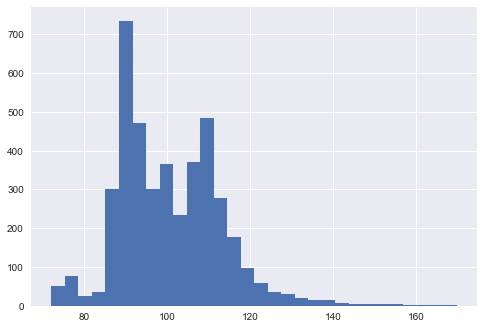

In [16]:
# SalePriceのヒストグラム
# bins:ビン数(表示する棒の数、デフォルトは10)
df_train["y"].hist(bins=30)

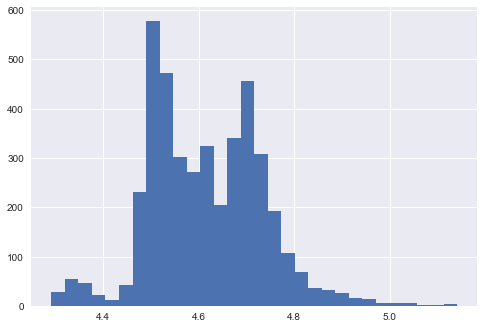

In [18]:
# 高いほうに向かって裾野が広い分布は、対数変換をかけてやる
df_train["y"] = np.log1p(df_train["y"])
#対数変換後の分布を確認
df_train["y"].hist(bins=30)

In [19]:
#今回はノンカテゴリカルな変数は存在しない

## One Hot Encodingと欠損値の穴埋め

In [20]:
#One Hot Encoding
df_all = pd.get_dummies(df_all)
# 今回は欠損値無し

## Lassoのハイパーパラメータの最適値を求める

In [21]:
#学習データ、テストデータに分割
# X: df_allの1行目からdf_trainの行数目まで(トレーニングデータセット部分)
X = df_all[:df_train.shape[0]]
# X_for_test: df_trainの行数目+1から最終行まで(テストデータセット部分)
X_for_test = df_all[df_train.shape[0]:]
y = df_train.y
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1111)

In [77]:
best_r2 = -100
for num in range (1, 100):
    alpha = num*0.000001
    reg = Lasso(alpha=alpha, max_iter=15000)
    reg.fit(X_train, y_train)
    y_pred = reg.predict(X_test)
    r2 = r2_score(y_pred, y_test)
    if best_r2 < r2 :
        best_r2 = r2
        best_alpha = alpha
        
print("alpha:", best_alpha,", ラッソ回帰でのR^2:", best_r2)

alpha: 7e-06 , ラッソ回帰でのR^2: 0.334870969002


## Lassoの適用

In [79]:
# 最適値を適用
reg = Lasso(alpha=best_alpha, max_iter=15000)
# 全データで学習
reg.fit(X,y)

Lasso(alpha=7e-06, copy_X=True, fit_intercept=True, max_iter=15000,
   normalize=False, positive=False, precompute=False, random_state=None,
   selection='cyclic', tol=0.0001, warm_start=False)

In [80]:
# 対数変換をしたのでexpをとる
pred = np.expm1(reg.predict(X_for_test))

In [81]:
solution = pd.DataFrame({"id":df_test.index, "y":pred})
solution.to_csv("test_lasso_mel.csv", index = False)

# 結果

Score: 0.53038  
順位: 3129/3835(下位18％）

## 考察

- そもそもLassoが向かないのではないか？
 - 重要な説明変数が少数ではない？
- 外れ値と思って除外したが実は重要な意味を持っていた？
- Lassoは綺麗に正規分布していないと性能が出ないのか？